# Pacotes

In [1]:
import pandas as pd
import numpy as np
import shapefile as shp  # Requires the pyshp package
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from math import sin, cos, sqrt, atan2, radians
from sklearn import preprocessing
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_error as mse

# Funções

In [2]:
###############[longitude, latitude, altitude]############################
arcoverde_pe = [-37.08, -8.41, 680.7] #reverificado
cabrobo_pe = [-39.33, -8.51, 341.46] #reverificado
garanhuns_pe = [-36.51, -8.88, 822.76] #reverificado
oricuri_pe = [-40.04, -7.9, 459.28] #reverificado
petrolina_pe = [-40.46, -9.36, 370.46] #reverificado
recife_pe = [-34.95, -8.05, 10] #reverificado
surubim_pe = [-35.71, -7.83, 418.32] #reverificado
triunfo_pe = [-38.11, -7.81, 1105] #reverificado

dic_cities_pe = {'df_arcoverde_pe':arcoverde_pe, 'df_cabrobo_pe':cabrobo_pe, 'df_garanhuns_pe': garanhuns_pe,
                 'df_oricuri_pe':oricuri_pe, 'df_petrolina_pe':petrolina_pe,'df_recife_pe':recife_pe,
                 'df_surubim_pe':surubim_pe, 'df_triunfo_pe':triunfo_pe}

def get_most_proximal_city(a, dict_cities_pe = dic_cities_pe):
    '''
    a is a list of latitude and longitude
    dict_cities_pe is the dictionary of cities
    '''
    list_cities_distance = []
    def get_distance(a,b):
        
        # approximate radius of earth in km
        R = 6373.0

        lat1 = radians(a[1])
        lon1 = radians(a[0])
        lat2 = radians(b[1])
        lon2 = radians(b[0])

        dlon = lon2 - lon1
        dlat = lat2 - lat1

        a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
        c = 2 * atan2(sqrt(a), sqrt(1 - a))

        distance = R * c

        return distance
    
    for i in dic_cities_pe.keys():
        list_cities_distance.append([i, get_distance(np.array(a), np.array(dic_cities_pe[i][0:2]))])
        
    list_cities_distance.sort(key = lambda x: x[1])
    
    return list_cities_distance[0][0]

def get_annual_mean_from_clima_data(df_in, column):
    
    for i in range(0,len(df_in)):
        prox_city = get_most_proximal_city(df_in.iloc[i,0:2].values)
        mean_annual = 0
        
        if prox_city == 'df_arcoverde_pe':
            mean_annual = df_arcoverde_pe[column].mean()
            
        elif prox_city == 'df_cabrobo_pe':
            mean_annual = df_cabrobo_pe[column].mean()
            
        elif prox_city == 'df_garanhuns_pe':
            mean_annual = df_garanhuns_pe[column].mean()
            
        elif prox_city == 'df_oricuri_pe':
            mean_annual = df_oricuri_pe[column].mean()
            
        elif prox_city == 'df_petrolina_pe':
            mean_annual = df_petrolina_pe[column].mean()
            
        elif prox_city == 'df_recife_pe':
            mean_annual = df_recife_pe[column].mean()

        elif prox_city == 'df_surubim_pe':
            mean_annual = df_surubim_pe[column].mean()

        elif prox_city == 'df_triunfo_pe':
            mean_annual = df_triunfo_pe[column].mean()

        df_in.iloc[i,2] = mean_annual
        
    return df_in

get_most_proximal_city(np.array([-35.7, -7.8]))

'df_surubim_pe'

# Upando Bancos

## LABREN

In [3]:
df_diffuse = pd.read_csv('radiacao_PE/diffuse_means_PE.csv', sep=';')
df_diffuse.head()

,ID,UF,LON,LAT,ANNUAL,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,35974,Pernambuco,-40.749,-9.5005,2047,2235,2365,2250,2087,1845,1685,1721,1855,1970,2090,2137,2323
1,35975,Pernambuco,-40.649,-9.5005,2060,2277,2378,2253,2107,1863,1699,1741,1878,1965,2081,2139,2335
2,35976,Pernambuco,-40.549,-9.5005,2079,2245,2394,2283,2107,1889,1732,1768,1906,1974,2107,2214,2324
3,36352,Pernambuco,-40.749,-9.4005,2046,2251,2377,2256,2082,1848,1678,1722,1873,1962,2069,2138,2297
4,36353,Pernambuco,-40.649,-9.4005,2038,2262,2365,2264,2095,1866,1695,1730,1859,1894,2032,2122,2278


In [4]:
df_direct_normal = pd.read_csv('radiacao_PE/direct_normal_means_PE.csv', sep=';')
df_direct_normal.head()

,ID,UF,LON,LAT,ANNUAL,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,35974,Pernambuco,-40.749,-9.5005,5668,6173,5241,5408,4725,5075,5211,5495,6061,6321,5986,6396,5923
1,35975,Pernambuco,-40.649,-9.5005,5582,6040,5233,5380,4647,4964,5054,5346,5877,6315,5978,6300,5851
2,35976,Pernambuco,-40.549,-9.5005,5468,6056,5171,5296,4613,4788,4835,5082,5744,6248,5879,6082,5821
3,36352,Pernambuco,-40.749,-9.4005,5683,6128,5244,5397,4791,5068,5230,5535,5954,6348,6058,6434,6004
4,36353,Pernambuco,-40.649,-9.4005,5652,6121,5262,5368,4700,4921,5065,5351,5903,6534,6134,6437,6029


In [5]:
df_foto_active = pd.read_csv('radiacao_PE/foto_ativa_means_PE.csv', sep=';')
df_foto_active.head()

,ID,UF,LON,LAT,ANNUAL,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,35974,Pernambuco,-40.749,-9.5005,5834,6026,5892,6019,5454,5296,5130,5383,5988,6417,6271,6230,5904
1,35975,Pernambuco,-40.649,-9.5005,5787,5972,5890,5991,5419,5232,5033,5294,5887,6401,6253,6192,5872
2,35976,Pernambuco,-40.549,-9.5005,5740,5966,5872,5975,5391,5148,4950,5175,5832,6367,6201,6144,5861
3,36352,Pernambuco,-40.749,-9.4005,5833,6025,5891,6015,5464,5286,5126,5390,5939,6417,6286,6227,5927
4,36353,Pernambuco,-40.649,-9.4005,5809,6011,5888,5987,5428,5204,5054,5285,5895,6473,6318,6229,5933


In [6]:
df_global_horizontal = pd.read_csv('radiacao_PE/global_horizontal_means_PE.csv', sep=';')
df_global_horizontal.head()

,ID,UF,LON,LAT,ANNUAL,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,35974,Pernambuco,-40.749,-9.5005,5811,6408,6089,6010,5246,4944,4709,4979,5681,6334,6425,6581,6333
1,35975,Pernambuco,-40.649,-9.5005,5766,6347,6088,5983,5213,4887,4624,4900,5587,6318,6408,6540,6296
2,35976,Pernambuco,-40.549,-9.5005,5722,6339,6068,5967,5187,4811,4553,4795,5537,6284,6353,6488,6283
3,36352,Pernambuco,-40.749,-9.4005,5813,6402,6089,6006,5258,4940,4712,4990,5640,6336,6442,6578,6357
4,36353,Pernambuco,-40.649,-9.4005,5790,6384,6085,5980,5225,4865,4648,4896,5598,6389,6473,6578,6362


In [7]:
df_plano_inclinado = pd.read_csv('radiacao_PE/plano_enclinado_means_PE.csv', sep=';')
df_plano_inclinado.head()

,ID,UF,LON,LAT,ANNUAL,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,35974,Pernambuco,-40.749,-9.5005,2454,2645,2551,2549,2386,2185,2073,2149,2388,2613,2690,2690,2524
1,35975,Pernambuco,-40.649,-9.5005,2439,2623,2549,2541,2377,2169,2047,2121,2357,2610,2689,2673,2509
2,35976,Pernambuco,-40.549,-9.5005,2418,2610,2540,2528,2363,2142,2017,2071,2331,2595,2669,2639,2505
3,36352,Pernambuco,-40.749,-9.4005,2457,2646,2559,2550,2388,2193,2074,2150,2371,2618,2703,2694,2543
4,36353,Pernambuco,-40.649,-9.4005,2450,2637,2555,2541,2383,2167,2050,2117,2359,2643,2717,2685,2543


## INMET

In [8]:
df_cabrobo_pe = pd.read_csv('clima_PE/cabrobo_1999_2015.txt', sep=';')
df_cabrobo_pe.drop(columns=['Unnamed: 16'], inplace=True)
df_cabrobo_pe['Altitude'] = np.ones(len(df_cabrobo_pe))*dic_cities_pe['df_cabrobo_pe'][2]
df_cabrobo_pe.head()

,Estacao,Data,Hora,VelocidadeVentoMedia,VelocidadeVentoMaximaMedia,EvapoBHPotencial,InsolacaoTotal,NebulosidadeMedia,NumDiasPrecipitacao,PrecipitacaoTotal,PressaoMedia,TempMaximaMedia,TempCompensadaMedia,TempMinimaMedia,UmidadeRelativaMedia,VisibilidadeMedia,Altitude
0,82886,31/01/1999,0,3.244565,6.0,NaN,223.16,6.741935,4.0,16.2,969.462366,34.467742,29.088387,24.387097,49.500000,NaN,341.46
1,82886,28/02/1999,0,3.802410,7.8,NaN,214.60,7.107143,3.0,9.3,970.285714,34.492857,28.914286,24.150000,49.241071,NaN,341.46
2,82886,31/03/1999,0,3.041935,8.0,NaN,207.40,7.333333,16.0,87.7,969.610753,32.577419,27.441290,23.148387,60.596774,NaN,341.46
3,82886,30/04/1999,0,4.040000,7.5,NaN,260.40,6.100000,2.0,46.0,971.145556,33.040000,27.738667,23.193333,54.200000,NaN,341.46
4,82886,31/05/1999,0,4.216129,9.5,NaN,234.80,6.010753,6.0,7.0,972.217204,31.809677,26.456774,22.141935,58.653226,NaN,341.46


In [9]:
df_oricuri_pe = pd.read_csv('clima_PE/oricuri_1999_2015.txt', sep=';')
df_oricuri_pe.drop(columns=['Unnamed: 16'], inplace=True)
df_oricuri_pe['Altitude'] = np.ones(len(df_oricuri_pe))*dic_cities_pe['df_oricuri_pe'][2]
df_oricuri_pe.head()

,Estacao,Data,Hora,VelocidadeVentoMedia,VelocidadeVentoMaximaMedia,EvapoBHPotencial,InsolacaoTotal,NebulosidadeMedia,NumDiasPrecipitacao,PrecipitacaoTotal,PressaoMedia,TempMaximaMedia,TempCompensadaMedia,TempMinimaMedia,UmidadeRelativaMedia,VisibilidadeMedia,Altitude
0,82753,31/01/1999,0,2.207527,5.6,NaN,200.0,5.688172,15.0,131.9,957.220430,31.425806,26.062581,22.064516,77.338710,NaN,459.28
1,82753,28/02/1999,0,2.508434,7.0,NaN,176.0,6.369048,7.0,81.5,957.778571,32.128571,26.313571,22.192857,74.250000,NaN,459.28
2,82753,31/03/1999,0,1.708696,5.0,NaN,170.5,6.516129,17.0,270.7,957.449462,29.338710,24.574839,21.267742,85.467742,NaN,459.28
3,82753,30/04/1999,0,2.375281,4.8,NaN,228.4,4.677778,4.0,44.7,959.147778,29.790000,24.362667,20.466667,82.841667,NaN,459.28
4,82753,31/05/1999,0,2.629348,6.5,NaN,202.4,5.387097,8.0,66.0,959.968817,30.470968,24.238065,19.803226,78.379032,NaN,459.28


In [10]:
df_arcoverde_pe = pd.read_csv('clima_PE/arcoverde_1999_2015.txt', sep=';')
df_arcoverde_pe.drop(columns=['Unnamed: 16'], inplace=True)
df_arcoverde_pe['Altitude'] = np.ones(len(df_arcoverde_pe))*dic_cities_pe['df_arcoverde_pe'][2]
df_arcoverde_pe.head()

,Estacao,Data,Hora,VelocidadeVentoMedia,VelocidadeVentoMaximaMedia,EvapoBHPotencial,InsolacaoTotal,NebulosidadeMedia,NumDiasPrecipitacao,PrecipitacaoTotal,PressaoMedia,TempMaximaMedia,TempCompensadaMedia,TempMinimaMedia,UmidadeRelativaMedia,VisibilidadeMedia,Altitude
0,82890,31/01/1999,0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,680.7
1,82890,30/04/1999,0,4.350562,7.6,NaN,273.4,4.067416,3.0,3.4,934.961798,31.626667,24.832000,19.600000,66.058333,NaN,680.7
2,82890,31/05/1999,0,3.880645,7.1,NaN,235.8,5.645161,8.0,78.1,935.821505,28.083871,22.892258,18.974194,82.314516,NaN,680.7
3,82890,30/06/1999,0,3.837778,8.0,NaN,250.8,5.533333,10.0,15.2,936.743333,28.140000,22.106667,17.866667,79.666667,NaN,680.7
4,82890,31/07/1999,0,3.866667,7.1,NaN,224.3,5.989247,14.0,70.0,938.486022,25.619355,20.446452,16.435484,82.153226,NaN,680.7


In [11]:
df_garanhuns_pe = pd.read_csv('clima_PE/garanhuns_1999_2015.txt', sep=';')
df_garanhuns_pe.drop(columns=['Unnamed: 16'], inplace=True)
df_garanhuns_pe['Altitude'] = np.ones(len(df_garanhuns_pe))*dic_cities_pe['df_garanhuns_pe'][2]
df_garanhuns_pe.head()

,Estacao,Data,Hora,VelocidadeVentoMedia,VelocidadeVentoMaximaMedia,EvapoBHPotencial,InsolacaoTotal,NebulosidadeMedia,NumDiasPrecipitacao,PrecipitacaoTotal,PressaoMedia,TempMaximaMedia,TempCompensadaMedia,TempMinimaMedia,UmidadeRelativaMedia,VisibilidadeMedia,Altitude
0,82893,31/01/1999,0,4.101149,8.3,NaN,257.8,5.444444,2.0,1.2,919.976667,30.120000,22.930667,18.280000,68.450000,NaN,822.76
1,82893,28/02/1999,0,4.197500,6.6,NaN,207.1,6.130952,6.0,21.9,920.711905,29.075000,22.725714,18.585714,72.017857,NaN,822.76
2,82893,31/03/1999,0,3.643902,7.1,NaN,233.9,6.131868,4.0,1.8,919.850549,29.632258,23.024667,18.346667,70.400000,NaN,822.76
3,82893,30/04/1999,0,3.496250,5.6,NaN,257.1,5.566667,5.0,14.6,921.572222,28.706667,22.590667,18.913333,72.275000,NaN,822.76
4,82893,31/05/1999,0,3.087500,5.8,NaN,197.4,7.204301,17.0,81.1,922.330108,25.751613,21.007097,17.632258,84.435484,NaN,822.76


In [12]:
df_petrolina_pe = pd.read_csv('clima_PE/petrolina_1999_2015.txt', sep=';')
df_petrolina_pe.drop(columns=['Unnamed: 16'], inplace=True)
df_petrolina_pe['Altitude'] = np.ones(len(df_petrolina_pe))*dic_cities_pe['df_petrolina_pe'][2]
df_petrolina_pe.head()

,Estacao,Data,Hora,VelocidadeVentoMedia,VelocidadeVentoMaximaMedia,EvapoBHPotencial,InsolacaoTotal,NebulosidadeMedia,NumDiasPrecipitacao,PrecipitacaoTotal,PressaoMedia,TempMaximaMedia,TempCompensadaMedia,TempMinimaMedia,UmidadeRelativaMedia,VisibilidadeMedia,Altitude
0,82983,31/01/1999,0,2.717568,8.0,NaN,235.0,5.364865,NaN,88.9,966.652703,33.619355,28.720000,24.141935,NaN,NaN,370.46
1,82983,28/02/1999,0,3.034524,5.0,NaN,241.5,6.047619,NaN,33.8,967.763095,34.442857,28.873571,24.164286,48.830357,NaN,370.46
2,82983,31/03/1999,0,2.652688,5.0,NaN,238.9,5.989247,NaN,167.1,967.252688,32.267742,27.307097,23.196774,58.967742,NaN,370.46
3,82983,30/04/1999,0,3.248889,5.0,NaN,272.5,5.488889,NaN,0.0,969.081111,33.283333,28.268667,23.750000,48.683333,NaN,370.46
4,82983,31/05/1999,0,3.382796,5.0,NaN,222.2,5.376344,NaN,4.2,969.955914,31.648387,26.559355,22.496774,54.838710,NaN,370.46


In [13]:
df_recife_pe = pd.read_csv('clima_PE/recife_1999_2015.txt', sep=';')
df_recife_pe.drop(columns=['Unnamed: 16'], inplace=True)
df_recife_pe['Altitude'] = np.ones(len(df_recife_pe))*dic_cities_pe['df_recife_pe'][2]
df_recife_pe.head()

,Estacao,Data,Hora,VelocidadeVentoMedia,VelocidadeVentoMaximaMedia,EvapoBHPotencial,InsolacaoTotal,NebulosidadeMedia,NumDiasPrecipitacao,PrecipitacaoTotal,PressaoMedia,TempMaximaMedia,TempCompensadaMedia,TempMinimaMedia,UmidadeRelativaMedia,VisibilidadeMedia,Altitude
0,82900,31/01/1999,0,2.987097,5.0,NaN,257.8,6.129032,10.0,44.7,NaN,30.987097,27.369677,23.006452,70.830645,NaN,10.0
1,82900,28/02/1999,0,3.590476,6.1,NaN,211.6,6.321429,12.0,18.8,NaN,31.128571,27.812143,24.146429,70.437500,NaN,10.0
2,82900,31/03/1999,0,3.051613,6.6,NaN,249.8,6.204301,13.0,196.9,1010.11828,30.638710,27.417419,23.719355,73.403226,NaN,10.0
3,82900,30/04/1999,0,3.083333,5.3,NaN,242.7,5.966667,13.0,103.4,NaN,30.383333,27.005333,22.753333,73.800000,NaN,10.0
4,82900,31/05/1999,0,2.407527,6.6,NaN,220.2,6.462366,27.0,306.1,NaN,29.345161,25.836774,22.454839,81.403226,NaN,10.0


In [14]:
df_surubim_pe = pd.read_csv('clima_PE/surubim_1999_2015.txt', sep=';')
df_surubim_pe.drop(columns=['Unnamed: 16'], inplace=True)
df_surubim_pe['Altitude'] = np.ones(len(df_surubim_pe))*dic_cities_pe['df_surubim_pe'][2]
df_surubim_pe.head()

,Estacao,Data,Hora,VelocidadeVentoMedia,VelocidadeVentoMaximaMedia,EvapoBHPotencial,InsolacaoTotal,NebulosidadeMedia,NumDiasPrecipitacao,PrecipitacaoTotal,PressaoMedia,TempMaximaMedia,TempCompensadaMedia,TempMinimaMedia,UmidadeRelativaMedia,VisibilidadeMedia,Altitude
0,82797,31/01/1999,0,3.674194,5.8,NaN,252.1,6.698925,1.0,4.6,963.264516,31.283871,24.952258,21.441935,70.669355,NaN,418.32
1,82797,28/02/1999,0,5.183333,7.8,NaN,209.8,6.738095,7.0,21.6,963.405952,31.878571,25.415714,21.196429,70.223214,NaN,418.32
2,82797,31/03/1999,0,4.066667,7.5,NaN,251.5,6.483871,4.0,93.3,962.646237,31.667742,25.587742,21.467742,71.862903,NaN,418.32
3,82797,30/04/1999,0,4.751111,8.0,NaN,247.2,6.333333,5.0,9.1,963.937778,31.810000,25.702667,21.380000,69.408333,NaN,418.32
4,82797,31/05/1999,0,4.027957,7.8,NaN,232.2,6.623656,8.0,45.2,964.593548,29.296774,24.561290,20.580645,74.419355,NaN,418.32


In [15]:
df_triunfo_pe = pd.read_csv('clima_PE/triunfo_1999_2015.txt', sep=';')
df_triunfo_pe.drop(columns=['Unnamed: 16'], inplace=True)
df_triunfo_pe['Altitude'] = np.ones(len(df_triunfo_pe))*dic_cities_pe['df_triunfo_pe'][2]
df_triunfo_pe.head()

,Estacao,Data,Hora,VelocidadeVentoMedia,VelocidadeVentoMaximaMedia,EvapoBHPotencial,InsolacaoTotal,NebulosidadeMedia,NumDiasPrecipitacao,PrecipitacaoTotal,PressaoMedia,TempMaximaMedia,TempCompensadaMedia,TempMinimaMedia,UmidadeRelativaMedia,VisibilidadeMedia,Altitude
0,82789,31/01/1999,0,1.840860,5.0,NaN,220.1,3.860215,4.0,94.7,899.866667,29.119355,23.764516,19.016129,61.072581,NaN,1105.0
1,82789,28/02/1999,0,1.945238,5.0,NaN,206.1,5.642857,11.0,121.2,900.904762,27.564286,22.496429,18.428571,70.758929,NaN,1105.0
2,82789,31/03/1999,0,2.044086,5.0,NaN,229.1,5.559140,13.0,132.4,900.892473,27.512903,22.552258,18.722581,70.637097,NaN,1105.0
3,82789,30/04/1999,0,2.507778,5.8,NaN,252.1,4.277778,6.0,58.8,900.340000,27.390000,22.507333,18.340000,66.366667,NaN,1105.0
4,82789,31/05/1999,0,2.889011,6.6,NaN,228.7,4.698925,9.0,107.8,901.961290,26.225806,21.146452,17.841935,75.024194,NaN,1105.0


## PVGIS - SARAH

In [16]:
df_pvgis_sarah_Em = pd.read_csv('PVGIS_PE/df_pvgis_sarah_Em.csv', sep=';')
df_pvgis_sarah_Em.head()

,ID,UF,LON,LAT,ANNUAL,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,35974,Pernambuco,-40.749,-9.5005,140.0,154.0,135.0,149.0,131.0,118.0,110.0,120.0,140.0,152.0,161.0,155.0,152.0
1,35975,Pernambuco,-40.649,-9.5005,140.0,153.0,134.0,149.0,131.0,118.0,110.0,120.0,139.0,152.0,161.0,155.0,152.0
2,35976,Pernambuco,-40.549,-9.5005,138.0,153.0,133.0,147.0,131.0,116.0,108.0,117.0,137.0,151.0,161.0,154.0,151.0
3,36352,Pernambuco,-40.749,-9.4005,141.0,157.0,136.0,151.0,133.0,117.0,109.0,120.0,139.0,153.0,163.0,158.0,155.0
4,36353,Pernambuco,-40.649,-9.4005,139.0,155.0,134.0,150.0,131.0,115.0,107.0,117.0,137.0,150.0,161.0,158.0,155.0


In [17]:
df_pvgis_sarah_Hm = pd.read_csv('PVGIS_PE/df_pvgis_sarah_Hm.csv', sep=';')
df_pvgis_sarah_Hm.head()

,ID,UF,LON,LAT,ANNUAL,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,35974,Pernambuco,-40.749,-9.5005,184,203,177,196,172,156,146,159,185,200,212,204,201
1,35975,Pernambuco,-40.649,-9.5005,184,202,176,196,173,156,146,159,184,200,212,203,200
2,35976,Pernambuco,-40.549,-9.5005,182,202,176,194,172,154,143,156,181,198,211,203,199
3,36352,Pernambuco,-40.749,-9.4005,186,207,179,199,176,155,145,158,184,201,214,208,204
4,36353,Pernambuco,-40.649,-9.4005,184,204,177,197,173,152,142,155,181,198,212,207,204


In [18]:
df_pvgis_sarah_SDm = pd.read_csv('PVGIS_PE/df_pvgis_sarah_SDm.csv', sep=';')
df_pvgis_sarah_SDm.head()

,ID,UF,LON,LAT,ANNUAL,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,35974,Pernambuco,-40.749,-9.5005,4.07,16.2,9.33,8.51,10.70,9.65,7.91,8.52,7.19,5.40,9.59,10.6,12.1
1,35975,Pernambuco,-40.649,-9.5005,3.98,15.0,9.08,8.69,9.63,9.12,7.24,8.17,7.29,5.00,9.45,10.6,12.0
2,35976,Pernambuco,-40.549,-9.5005,4.31,14.7,9.58,8.62,9.46,10.10,7.60,8.54,7.41,5.17,8.87,10.5,11.4
3,36352,Pernambuco,-40.749,-9.4005,3.85,17.0,9.28,7.65,10.30,10.30,8.68,8.91,7.51,5.06,8.56,11.4,12.2
4,36353,Pernambuco,-40.649,-9.4005,4.09,15.5,9.54,7.45,9.14,11.30,8.80,9.48,7.61,5.03,8.32,10.9,11.1


## PVGIS - NSRDB

In [19]:
df_pvgis_nsrdb_Em = pd.read_csv('PVGIS_PE/df_pvgis_nsrdb_Em.csv', sep=';')
df_pvgis_nsrdb_Em.head()

,ID,UF,LON,LAT,ANNUAL,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,35974,Pernambuco,-40.749,-9.5005,145.0,163.0,138.0,151.0,133.0,123.0,114.0,126.0,147.0,153.0,167.0,162.0,160.0
1,35975,Pernambuco,-40.649,-9.5005,143.0,161.0,137.0,150.0,131.0,120.0,112.0,124.0,143.0,151.0,165.0,161.0,158.0
2,35976,Pernambuco,-40.549,-9.5005,139.0,157.0,132.0,146.0,129.0,116.0,110.0,120.0,140.0,149.0,162.0,157.0,154.0
3,36352,Pernambuco,-40.749,-9.4005,142.0,160.0,135.0,147.0,130.0,119.0,113.0,122.0,143.0,152.0,165.0,158.0,156.0
4,36353,Pernambuco,-40.649,-9.4005,142.0,162.0,136.0,149.0,132.0,120.0,111.0,121.0,143.0,150.0,166.0,161.0,158.0


In [20]:
df_pvgis_nsrdb_Hm = pd.read_csv('PVGIS_PE/df_pvgis_nsrdb_Hm.csv', sep=';')
df_pvgis_nsrdb_Hm.head()

,ID,UF,LON,LAT,ANNUAL,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,35974,Pernambuco,-40.749,-9.5005,191,215,182,199,175,162,151,167,193,201,219,213,211
1,35975,Pernambuco,-40.649,-9.5005,188,212,180,198,173,159,148,164,189,199,217,212,208
2,35976,Pernambuco,-40.549,-9.5005,184,206,175,193,170,154,146,159,185,195,213,207,203
3,36352,Pernambuco,-40.749,-9.4005,187,210,178,193,171,157,149,162,189,199,217,208,206
4,36353,Pernambuco,-40.649,-9.4005,188,214,179,197,174,159,146,160,188,198,218,212,208


In [21]:
df_pvgis_nsrdb_SDm = pd.read_csv('PVGIS_PE/df_pvgis_nsrdb_SDm.csv', sep=';')
df_pvgis_nsrdb_SDm.head()

,ID,UF,LON,LAT,ANNUAL,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC
0,35974,Pernambuco,-40.749,-9.5005,3.02,7.86,7.59,9.62,10.40,8.29,7.55,5.94,4.39,20.5,8.23,10.9,11.4
1,35975,Pernambuco,-40.649,-9.5005,2.89,6.64,8.02,9.07,10.80,7.87,7.18,5.85,5.80,19.8,7.65,10.0,10.8
2,35976,Pernambuco,-40.549,-9.5005,2.86,6.04,9.13,8.68,9.19,9.14,7.56,5.75,5.79,19.2,8.44,12.5,11.2
3,36352,Pernambuco,-40.749,-9.4005,2.60,7.60,8.38,8.41,10.80,7.76,7.05,7.24,5.04,20.0,8.94,13.2,10.9
4,36353,Pernambuco,-40.649,-9.4005,2.97,7.61,10.10,10.10,10.70,8.52,8.02,6.45,6.28,19.5,8.12,10.9,11.5


## Interpolando

In [22]:
##--------- Copiando de um banco com as posições corretas --------------------####

df_insolacao_Total = df_direct_normal.loc[:,['LON','LAT','ANNUAL']].copy()
df_PrecipitacaoTotal = df_direct_normal.loc[:,['LON','LAT','ANNUAL']].copy()
df_TempMaximaMedia = df_direct_normal.loc[:,['LON','LAT','ANNUAL']].copy()
df_VelocidadeVentoMedia = df_direct_normal.loc[:,['LON','LAT','ANNUAL']].copy()
df_VelocidadeVentoMaximaMedia = df_direct_normal.loc[:,['LON','LAT','ANNUAL']].copy()
df_Altitude = df_direct_normal.loc[:,['LON','LAT','ANNUAL']].copy()
df_UmidadeRelativaMedia = df_direct_normal.loc[:,['LON','LAT','ANNUAL']].copy()
df_TempMinimaMedia = df_direct_normal.loc[:,['LON','LAT','ANNUAL']].copy()
df_PressaoMedia = df_direct_normal.loc[:,['LON','LAT','ANNUAL']].copy()

##---------- Interpolando por vizinhos mais próximos ----------------------#####

df_insolacao_Total = get_annual_mean_from_clima_data(df_insolacao_Total, 'InsolacaoTotal')
df_PrecipitacaoTotal = get_annual_mean_from_clima_data(df_PrecipitacaoTotal, 'PrecipitacaoTotal')
df_TempMaximaMedia = get_annual_mean_from_clima_data(df_TempMaximaMedia, 'TempMaximaMedia')
df_VelocidadeVentoMedia = get_annual_mean_from_clima_data(df_VelocidadeVentoMedia, 'VelocidadeVentoMedia')
df_VelocidadeVentoMaximaMedia = get_annual_mean_from_clima_data(df_VelocidadeVentoMaximaMedia, 'VelocidadeVentoMaximaMedia')
df_Altitude = get_annual_mean_from_clima_data(df_Altitude, 'Altitude')
df_UmidadeRelativaMedia = get_annual_mean_from_clima_data(df_UmidadeRelativaMedia, 'UmidadeRelativaMedia')
df_TempMinimaMedia = get_annual_mean_from_clima_data(df_TempMinimaMedia, 'TempMinimaMedia')
df_PressaoMedia = get_annual_mean_from_clima_data(df_PressaoMedia, 'PressaoMedia')

# Visualizando

## Importando Mapa de Pernambuco

In [23]:
sf = shp.Reader("shapefile_PE/shapefile_PE.shp",encoding= "ISO-8859-1")

PE_map = []
for shape in sf.shapeRecords():
    x = [i[0] for i in shape.shape.points[:]]
    y = [i[1] for i in shape.shape.points[:]]
    if all(item < -34 for item in x):
        PE_map.append([x,y])

## Radiação Direta Normal

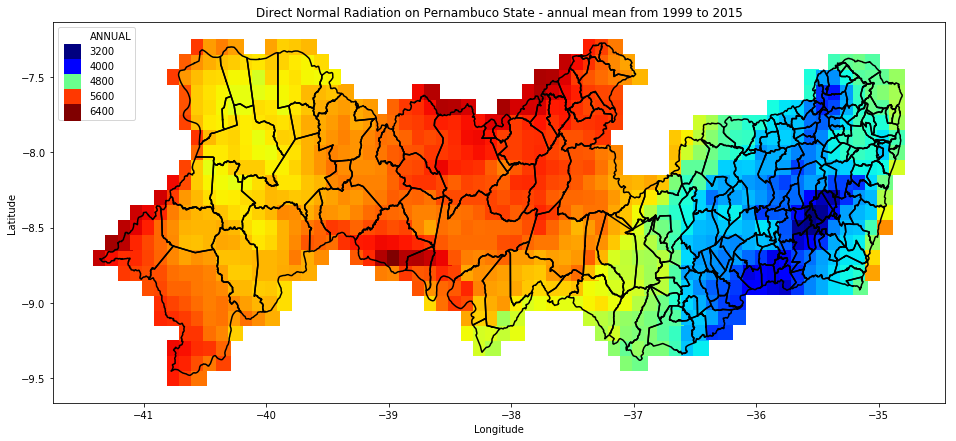

In [24]:
mpl.rcParams["scatter.marker"] = 's'

plt.figure(figsize=(16,7))

for i in range(0,len(PE_map)):
        axis = plt.plot(PE_map[i][0],PE_map[i][1],'k')
                        
sns.scatterplot(data=df_direct_normal,x='LON', y='LAT', hue='ANNUAL',
                palette = 'jet', size="ANNUAL", sizes=(230,250), linewidth=0)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Direct Normal Radiation on Pernambuco State - annual mean from 1999 to 2015')
plt.savefig('figuras/radiacao_direta.png', dpi=300)

## Modelo PVGIS Dados SARAH

Text(0.5, 1.0, 'Average monthly energy production on Pernambuco State - Estimation (KWh)')

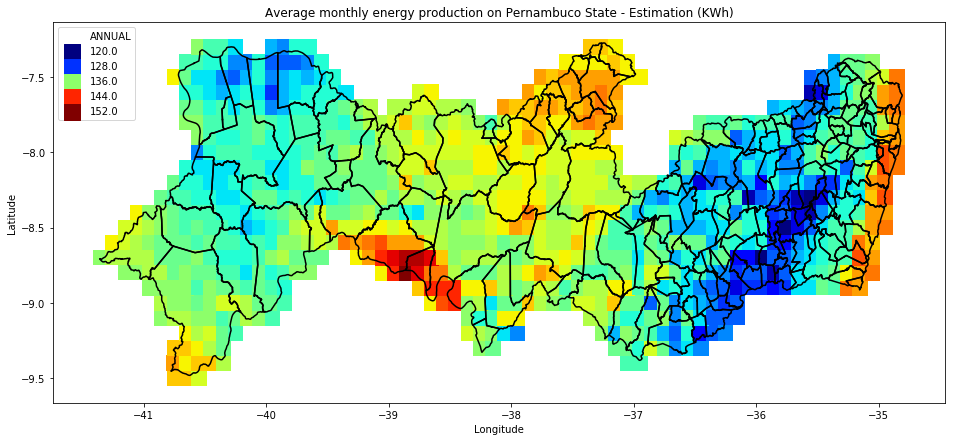

In [25]:
mpl.rcParams["scatter.marker"] = 's'

plt.figure(figsize=(16,7))

for i in range(0,len(PE_map)):
        axis = plt.plot(PE_map[i][0],PE_map[i][1],'k')
                        
sns.scatterplot(data=df_pvgis_sarah_Em,x='LON', y='LAT', hue='ANNUAL',
                palette = 'jet', size="ANNUAL", sizes=(230,250), linewidth=0)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Average monthly energy production on Pernambuco State - Estimation (KWh)')

## Modelo PVGIS Dados NSRDB

Text(0.5, 1.0, 'Average monthly energy production on Pernambuco State - Estimation (KWh)')

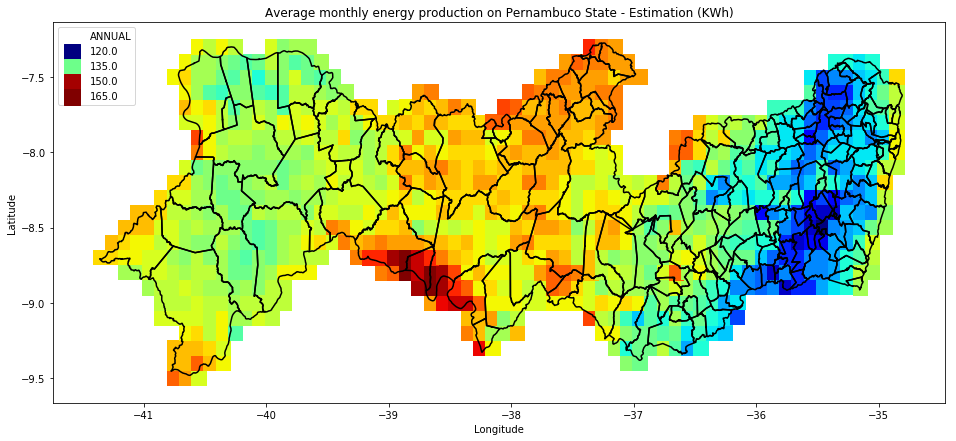

In [26]:
mpl.rcParams["scatter.marker"] = 's'

plt.figure(figsize=(16,7))

for i in range(0,len(PE_map)):
        axis = plt.plot(PE_map[i][0],PE_map[i][1],'k')
                        
sns.scatterplot(data=df_pvgis_nsrdb_Em,x='LON', y='LAT', hue='ANNUAL',
                palette = 'jet', size="ANNUAL", sizes=(230,250), linewidth=0)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Average monthly energy production on Pernambuco State - Estimation (KWh)')

## Precipitação Total

Text(0.5, 1.0, 'Total Precipitation on Pernambuco State - annual mean from 1999 to 2015')

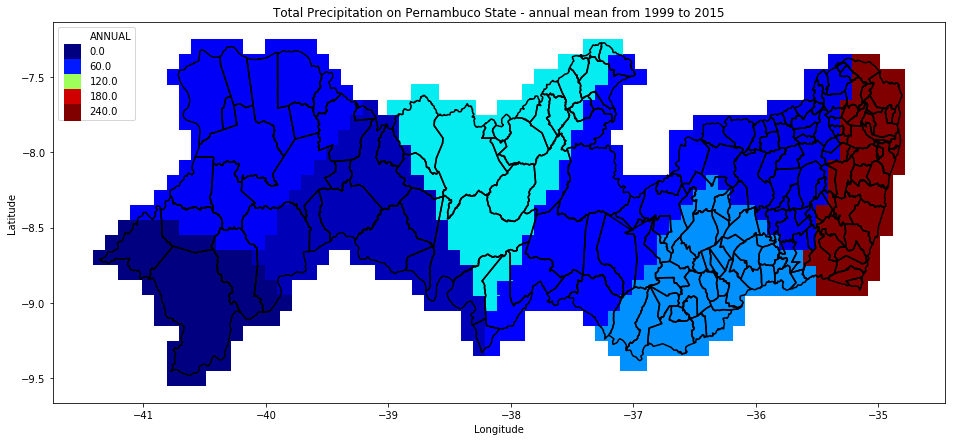

In [27]:
mpl.rcParams["scatter.marker"] = 's'

plt.figure(figsize=(16,7))

for i in range(0,len(PE_map)):
        axis = plt.plot(PE_map[i][0],PE_map[i][1],'k')
                        
sns.scatterplot(data=df_PrecipitacaoTotal,x='LON', y='LAT', hue='ANNUAL',
                palette = 'jet', size="ANNUAL", sizes=(230,250), linewidth=0)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Total Precipitation on Pernambuco State - annual mean from 1999 to 2015')

## Temperatura Maxima Media

Text(0.5, 1.0, 'Maxima Mean Temperature on Pernambuco State - annual mean from 1999 to 2015')

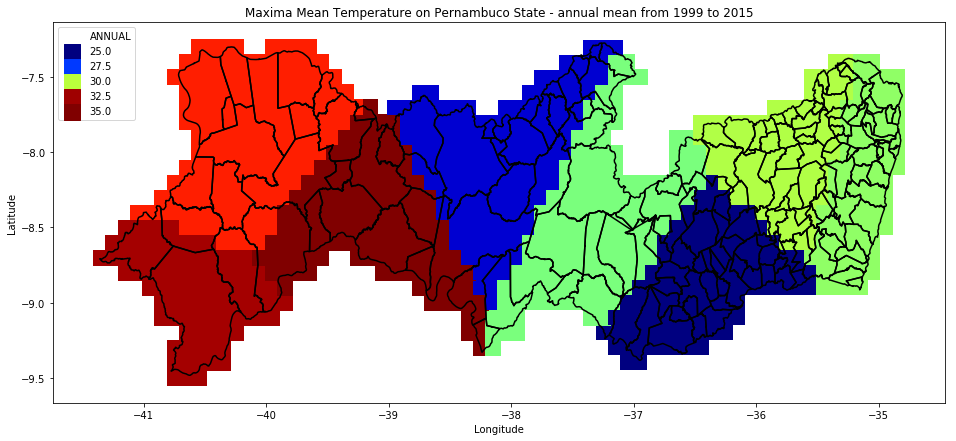

In [28]:
mpl.rcParams["scatter.marker"] = 's'

plt.figure(figsize=(16,7))

for i in range(0,len(PE_map)):
        axis = plt.plot(PE_map[i][0],PE_map[i][1],'k')
                        
sns.scatterplot(data=df_TempMaximaMedia,x='LON', y='LAT', hue='ANNUAL',
                palette = 'jet', size="ANNUAL", sizes=(230,250), linewidth=0)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Maxima Mean Temperature on Pernambuco State - annual mean from 1999 to 2015')

# Modelando

## Vou gerar um modelo não linear da seguinte forma

* Gerar a matriz de correlação (pearson) entre todas as features e a radiação direta.
* Gerar a matriz de covariância entre todas as features e a radiação direta.
* Modificar o sinal das variáveis 
* Componente quadrático: a = cov(feature)
* Componente linear: b = cor(feature)
* Métrica = a\*feature^2 + b\*feature

## Concatenando

In [29]:
data = {'Latitude': df_direct_normal.LAT, 'Longitude':df_direct_normal.LON,'DirectNormal': df_direct_normal.ANNUAL,
        'DifuseRadiation':df_diffuse.ANNUAL, 'FotoActive':df_foto_active.ANNUAL,'GlobalHorizonta':df_global_horizontal.ANNUAL,
        'PlanoInclinado':df_plano_inclinado.ANNUAL,'InsolacaoTotal':df_insolacao_Total.ANNUAL,
        'PreciptacaoTotal':df_PrecipitacaoTotal.ANNUAL, 'TempMaxMedia':df_TempMaximaMedia.ANNUAL,
        'VelocidadeVentoMedia':df_VelocidadeVentoMedia.ANNUAL, 'VelocidadeVentoMaximaMedia':df_VelocidadeVentoMaximaMedia.ANNUAL,
       'Altitude':df_Altitude.ANNUAL,'Umidade':df_UmidadeRelativaMedia.ANNUAL,'TempMinimaMedia':df_TempMinimaMedia.ANNUAL,
       'PressaoMedia':df_PressaoMedia.ANNUAL}

df_all_features = pd.DataFrame(data=data)
df_all_features.to_csv('df_all_features.csv',index=False)

## Dados já salvos

In [30]:
df_all_features = pd.read_csv('df_all_features.csv')

In [31]:
df_all_features.iloc[:,2:] = preprocessing.minmax_scale(df_all_features.iloc[:,2:].values)
df_all_features.head()

,Latitude,Longitude,DirectNormal,DifuseRadiation,FotoActive,GlobalHorizonta,PlanoInclinado,InsolacaoTotal,PreciptacaoTotal,TempMaxMedia,VelocidadeVentoMedia,VelocidadeVentoMaximaMedia,Altitude,Umidade,TempMinimaMedia,PressaoMedia
0,-9.5005,-40.749,0.879908,0.275253,0.870408,0.852729,0.829609,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759
1,-9.5005,-40.649,0.840185,0.308081,0.822449,0.806385,0.787709,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759
2,-9.5005,-40.549,0.787529,0.356061,0.774490,0.761071,0.729050,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759
3,-9.4005,-40.749,0.886836,0.272727,0.869388,0.854789,0.837989,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759
4,-9.4005,-40.649,0.872517,0.252525,0.844898,0.831102,0.818436,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759


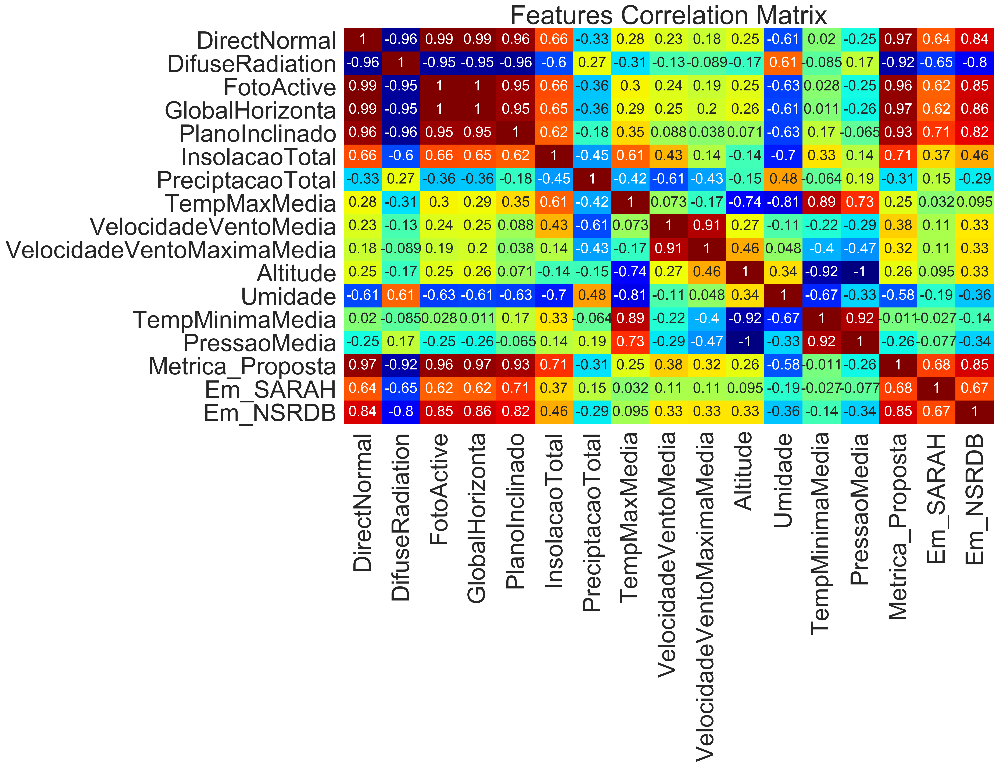

In [82]:
correlation_matrix = df_all_features.iloc[:,2:].corr()
fig = plt.figure(figsize=(16,10), dpi=300)
sns.set(font_scale = 3)
plt.title('Features Correlation Matrix')
sns.heatmap(correlation_matrix, cmap='jet', yticklabels=df_all_features.iloc[:,2:].columns,
            xticklabels=df_all_features.iloc[:,2:].columns, annot = True, annot_kws = {'fontsize': 18}, cbar=False)

plt.savefig('figuras/correlation_nopvgis.png', dpi=300)

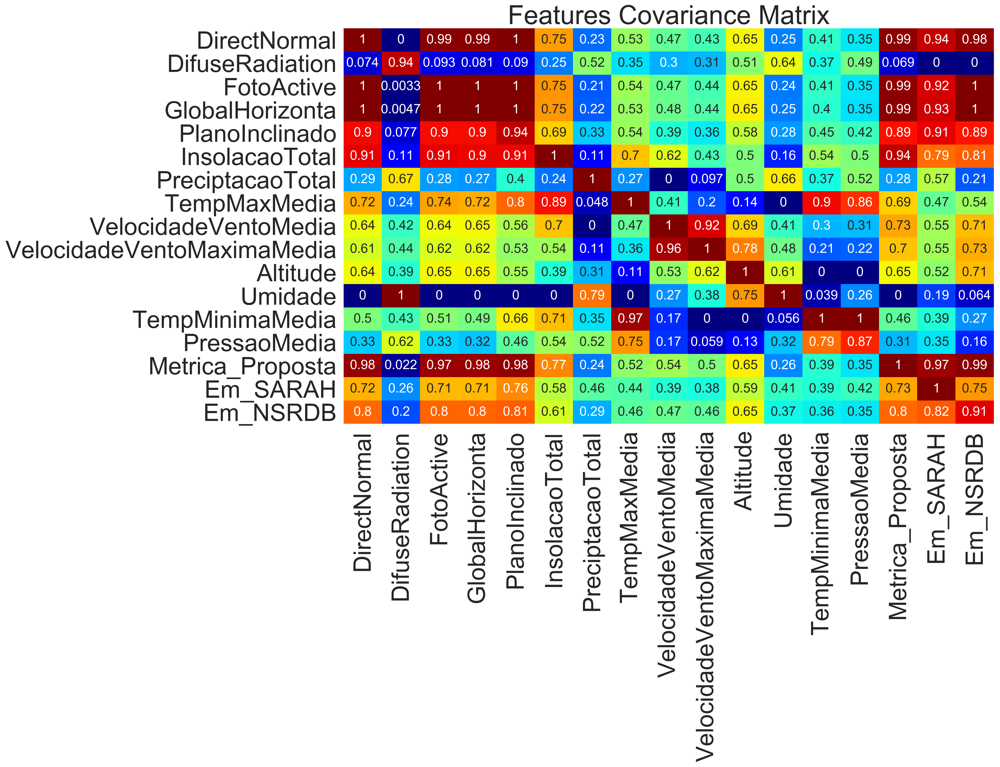

In [85]:
covariance_matrix = df_all_features.iloc[:,2:].cov()
covariance_matrix = preprocessing.minmax_scale(covariance_matrix)
fig = plt.figure(figsize=(16,10), dpi=300)

sns.set(font_scale = 3)
plt.title('Features Covariance Matrix')
sns.heatmap(covariance_matrix, cmap='jet', yticklabels=df_all_features.iloc[:,2:].columns,
            xticklabels=df_all_features.iloc[:,2:].columns, annot = True, annot_kws = {'fontsize': 18}, cbar = False)

plt.savefig('figuras/covariance_nopvgis.png', dpi=300)

In [34]:
df_all_features['Metrica_Proposta'] = df_all_features['DirectNormal']
df_all_features.head()

,Latitude,Longitude,DirectNormal,DifuseRadiation,FotoActive,GlobalHorizonta,PlanoInclinado,InsolacaoTotal,PreciptacaoTotal,TempMaxMedia,VelocidadeVentoMedia,VelocidadeVentoMaximaMedia,Altitude,Umidade,TempMinimaMedia,PressaoMedia,Metrica_Proposta
0,-9.5005,-40.749,0.879908,0.275253,0.870408,0.852729,0.829609,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759,0.879908
1,-9.5005,-40.649,0.840185,0.308081,0.822449,0.806385,0.787709,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759,0.840185
2,-9.5005,-40.549,0.787529,0.356061,0.774490,0.761071,0.729050,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759,0.787529
3,-9.4005,-40.749,0.886836,0.272727,0.869388,0.854789,0.837989,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759,0.886836
4,-9.4005,-40.649,0.872517,0.252525,0.844898,0.831102,0.818436,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759,0.872517


In [35]:
corelation_vector = correlation_matrix.iloc[0,:].values
covariance_vector = covariance_matrix[0,:]
###----------- alterando o sinal da correlação para:
corelation_vector[6] = -corelation_vector[6] # Precipitação Total
corelation_vector[7] = -corelation_vector[7] # TempMaxMedia
corelation_vector[11] = -corelation_vector[11] # Umidade
###------------
for i in range(0,len(df_all_features)):
    df_all_features.iloc[i,-1] = np.dot(covariance_vector, df_all_features.iloc[i,2:-1]**2) + np.dot(corelation_vector, df_all_features.iloc[i,2:-1]) 

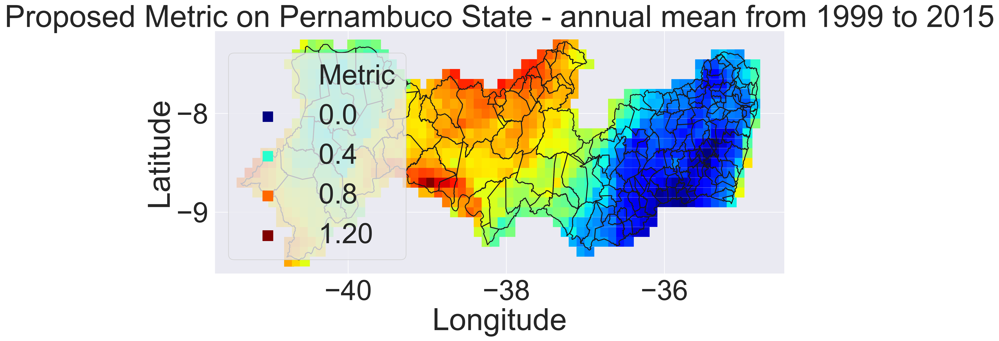

In [36]:
df_all_features.iloc[:,-1] = preprocessing.minmax_scale(df_all_features.iloc[:,-1].values)

mpl.rcParams["scatter.marker"] = 's'

plt.figure(figsize=(16,7), dpi=300)

for i in range(0,len(PE_map)):
        axis = plt.plot(PE_map[i][0],PE_map[i][1],'k')
                        
plot = sns.scatterplot(data=df_all_features,x='Longitude', y='Latitude', hue='Metrica_Proposta',
                palette = 'jet', size="Metrica_Proposta", sizes=(230,250), linewidth=0)

leg = plot.legend_
for t in leg.texts[1:]:
    # truncate label text to 4 characters
    t.set_text(t.get_text()[:4])

leg.texts[0].set_text('Metric')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Proposed Metric on Pernambuco State - annual mean from 1999 to 2015')

plt.savefig('figuras/metrica_proposta.png', dpi=300)

## Comparar métrica CovCor com SARAH e NSRDB e Apenas Radiação Direta

In [37]:
print('Metrica Proposta')
print('Em - NSRDB MAE:',
      mae(preprocessing.minmax_scale(df_pvgis_nsrdb_Em.ANNUAL), df_all_features.Metrica_Proposta))
print('Em - NSRDB MSE:',
      mse(preprocessing.minmax_scale(df_pvgis_nsrdb_Em.ANNUAL), df_all_features.Metrica_Proposta))
print('Em - SARAH MAE:',
      mae(preprocessing.minmax_scale(df_pvgis_sarah_Em.ANNUAL), df_all_features.Metrica_Proposta))
print('Em - SARAH MSE:',
      mse(preprocessing.minmax_scale(df_pvgis_sarah_Em.ANNUAL), df_all_features.Metrica_Proposta))

print('Direct Normal')
print('Em - NSRDB MAE:',
      mae(preprocessing.minmax_scale(df_pvgis_nsrdb_Em.ANNUAL), df_all_features.DirectNormal))
print('Em - NSRDB MSE:',
      mse(preprocessing.minmax_scale(df_pvgis_nsrdb_Em.ANNUAL), df_all_features.DirectNormal))
print('Em - SARAH MAE:',
      mae(preprocessing.minmax_scale(df_pvgis_sarah_Em.ANNUAL), df_all_features.DirectNormal))
print('Em - SARAH MSE',
      mse(preprocessing.minmax_scale(df_pvgis_sarah_Em.ANNUAL), df_all_features.DirectNormal))

Metrica Proposta
Em - NSRDB MAE: 0.10576633456188002
Em - NSRDB MSE: 0.019386795992484544
Em - SARAH MAE: 0.131027397822414
Em - SARAH MSE: 0.026333572467514985
Direct Normal
Em - NSRDB MAE: 0.12470865628436249
Em - NSRDB MSE: 0.020302053463229608
Em - SARAH MAE: 0.19929756635574614
Em - SARAH MSE 0.0515312753379681


Text(0.5, 1.0, 'Estimated Energy Production - Absolute Error - Proposed Metric NSRDB')

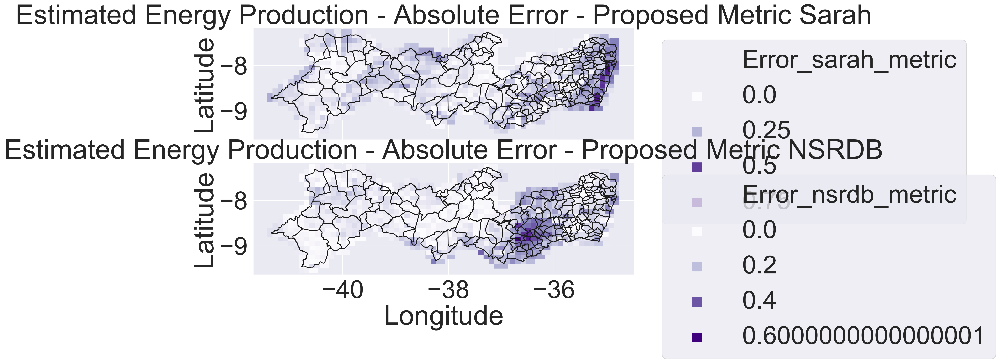

In [38]:
df_error_cov_cor = df_all_features.loc[:,['Latitude','Longitude']]
df_error_cov_cor['Error_sarah_metric'] = abs(preprocessing.minmax_scale(df_pvgis_sarah_Em.ANNUAL) - df_all_features.Metrica_Proposta)
df_error_cov_cor['Error_nsrdb_metric'] = abs(preprocessing.minmax_scale(df_pvgis_nsrdb_Em.ANNUAL) - df_all_features.Metrica_Proposta)

mpl.rcParams["scatter.marker"] = 's'

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, dpi=300)

for i in range(0,len(PE_map)):
        ax1.plot(PE_map[i][0],PE_map[i][1],'k')

sns.scatterplot(data=df_error_cov_cor, x='Longitude', y='Latitude', hue='Error_sarah_metric',
                palette = 'Purples', size='Error_sarah_metric', sizes=(230,250), linewidth=0, ax=ax1)

ax1.legend(bbox_to_anchor=(1.04,1), loc="upper left")
ax1.set_xlabel('Longitude')
ax1.set_title('Estimated Energy Production - Absolute Error - Proposed Metric Sarah')

for i in range(0,len(PE_map)):
        ax2.plot(PE_map[i][0],PE_map[i][1],'k')
                        
sns.scatterplot(data=df_error_cov_cor, x='Longitude', y='Latitude', hue='Error_nsrdb_metric',
                palette = 'Purples', size='Error_nsrdb_metric', sizes=(230,250), linewidth=0, ax=ax2)

ax2.legend(bbox_to_anchor=(1.04,1), loc="upper left")
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')
ax2.set_title('Estimated Energy Production - Absolute Error - Proposed Metric NSRDB')

# Adicionando PVGIS

In [39]:
df_all_features_pvgis = pd.read_csv('df_all_features.csv')

df_all_features_pvgis['Em_SARAH'] = df_pvgis_sarah_Em.ANNUAL
df_all_features_pvgis['Hm_SARAH'] = df_pvgis_sarah_Hm.ANNUAL
df_all_features_pvgis['SDm_SARAH'] = df_pvgis_sarah_SDm.ANNUAL
df_all_features_pvgis['Em_NSRDB'] = df_pvgis_nsrdb_Em.ANNUAL
df_all_features_pvgis['Hm_NSRDB'] = df_pvgis_nsrdb_Hm.ANNUAL
df_all_features_pvgis['SDm_NSRDM'] = df_pvgis_nsrdb_SDm.ANNUAL

In [40]:
df_all_features_pvgis.to_csv('df_all_features_pvgis.csv',index=False)
df_all_features_pvgis.head()

,Latitude,Longitude,DirectNormal,DifuseRadiation,FotoActive,GlobalHorizonta,PlanoInclinado,InsolacaoTotal,PreciptacaoTotal,TempMaxMedia,...,Altitude,Umidade,TempMinimaMedia,PressaoMedia,Em_SARAH,Hm_SARAH,SDm_SARAH,Em_NSRDB,Hm_NSRDB,SDm_NSRDM
0,-9.5005,-40.749,5668,2047,5834,5811,2454,256.416749,36.440196,32.475011,...,370.46,55.461397,22.395253,970.878576,140.0,184,4.07,145.0,191,3.02
1,-9.5005,-40.649,5582,2060,5787,5766,2439,256.416749,36.440196,32.475011,...,370.46,55.461397,22.395253,970.878576,140.0,184,3.98,143.0,188,2.89
2,-9.5005,-40.549,5468,2079,5740,5722,2418,256.416749,36.440196,32.475011,...,370.46,55.461397,22.395253,970.878576,138.0,182,4.31,139.0,184,2.86
3,-9.4005,-40.749,5683,2046,5833,5813,2457,256.416749,36.440196,32.475011,...,370.46,55.461397,22.395253,970.878576,141.0,186,3.85,142.0,187,2.60
4,-9.4005,-40.649,5652,2038,5809,5790,2450,256.416749,36.440196,32.475011,...,370.46,55.461397,22.395253,970.878576,139.0,184,4.09,142.0,188,2.97


## Só para visualizar mesmo

In [41]:
df_all_features['Em_SARAH'] = preprocessing.minmax_scale(df_pvgis_sarah_Em.ANNUAL)
df_all_features['Em_NSRDB'] = preprocessing.minmax_scale(df_pvgis_nsrdb_Em.ANNUAL)
df_all_features.head()

,Latitude,Longitude,DirectNormal,DifuseRadiation,FotoActive,GlobalHorizonta,PlanoInclinado,InsolacaoTotal,PreciptacaoTotal,TempMaxMedia,VelocidadeVentoMedia,VelocidadeVentoMaximaMedia,Altitude,Umidade,TempMinimaMedia,PressaoMedia,Metrica_Proposta,Em_SARAH,Em_NSRDB
0,-9.5005,-40.749,0.879908,0.275253,0.870408,0.852729,0.829609,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759,0.733158,0.695652,0.806452
1,-9.5005,-40.649,0.840185,0.308081,0.822449,0.806385,0.787709,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759,0.682466,0.695652,0.741935
2,-9.5005,-40.549,0.787529,0.356061,0.774490,0.761071,0.729050,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759,0.624578,0.608696,0.612903
3,-9.4005,-40.749,0.886836,0.272727,0.869388,0.854789,0.837989,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759,0.737873,0.739130,0.709677
4,-9.4005,-40.649,0.872517,0.252525,0.844898,0.831102,0.818436,1.0,0.0,0.965599,0.421058,0.139189,0.329187,0.0,1.0,0.635759,0.717486,0.652174,0.709677


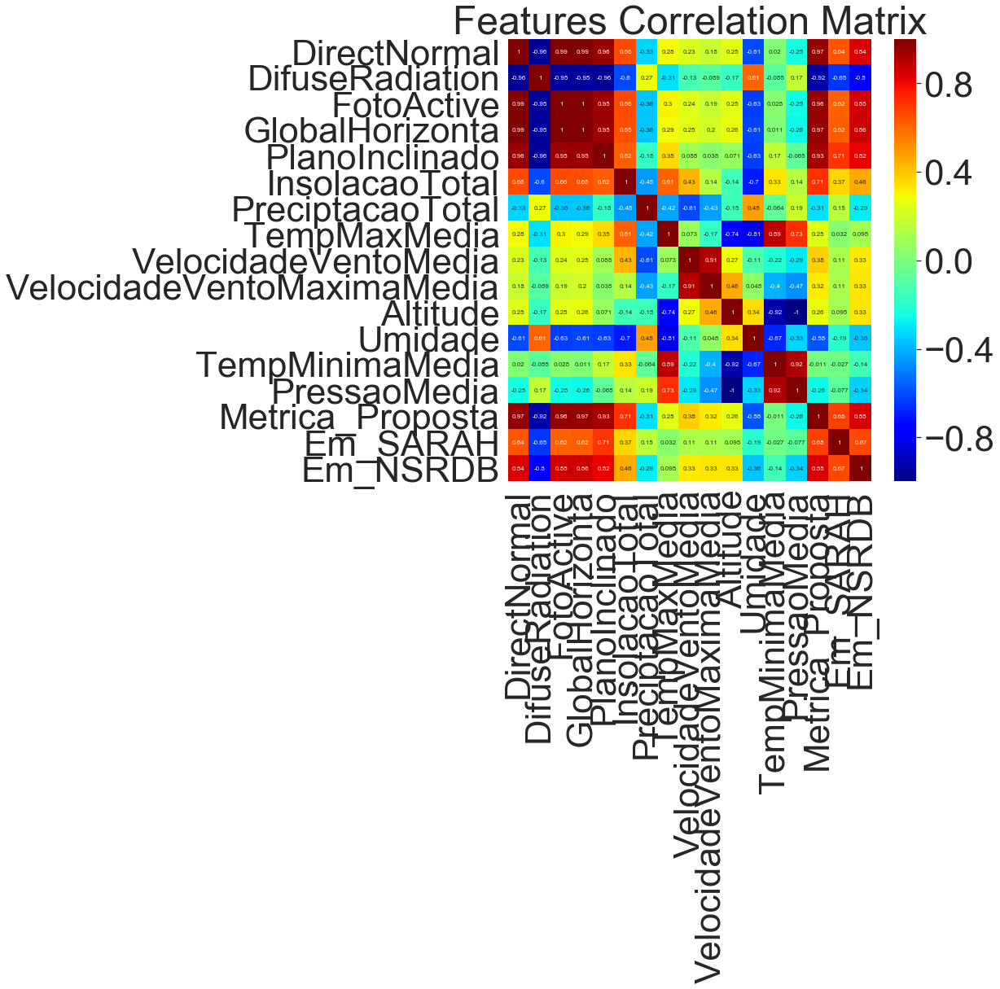

In [42]:
fig = plt.figure(figsize=(10,10))
plt.title('Features Correlation Matrix')
correlation_matrix = df_all_features.iloc[:,2:].corr()
sns.heatmap(correlation_matrix, cmap='jet', yticklabels=df_all_features.iloc[:,2:].columns,
            xticklabels=df_all_features.iloc[:,2:].columns, annot = True, annot_kws = {'fontsize': 8})

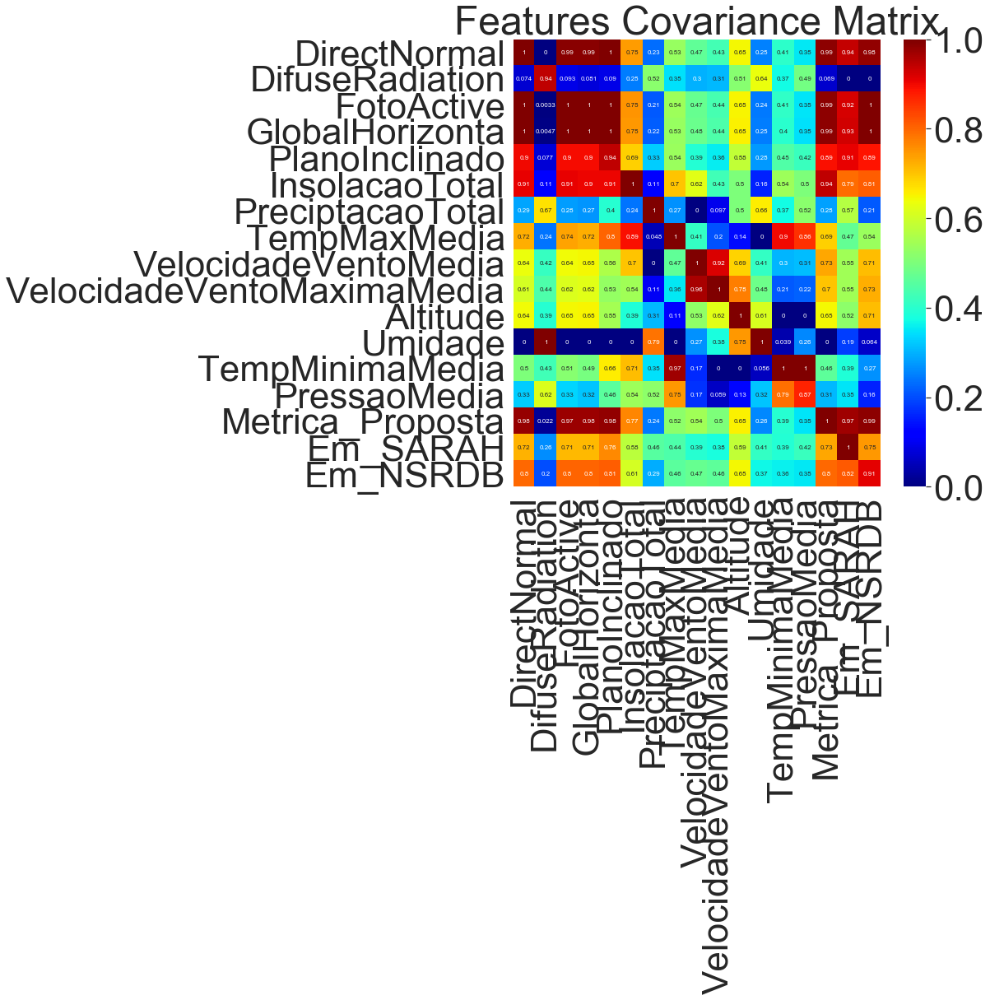

In [43]:
covariance_matrix = df_all_features.iloc[:,2:].cov()
covariance_matrix = preprocessing.minmax_scale(covariance_matrix)
fig = plt.figure(figsize=(10,10))
plt.title('Features Covariance Matrix')
sns.heatmap(covariance_matrix, cmap='jet', yticklabels=df_all_features.iloc[:,2:].columns,
            xticklabels=df_all_features.iloc[:,2:].columns, annot = True, annot_kws = {'fontsize': 8})